In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
df = pd.read_csv("C:\\Users\\Vinayak S N\\PycharmProjects\\AirQuality_Project\\Data\\clean_data\\combined_data.csv")
df.dropna(inplace=True)
print(df.shape)

(1092, 9)


In [7]:
df.head()

,T,TM,Tm,SLP,H,W,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


,T,TM,Tm,SLP,H,W,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833
...,...,...,...,...,...,...,...,...,...
1088,18.1,24.0,11.2,1015.4,56.0,1.8,15.9,25.9,288.416667
1089,17.8,25.0,10.7,1015.8,54.0,2.3,9.4,22.2,256.833333
1090,13.9,24.5,11.4,1015.0,95.0,0.6,8.7,14.8,169.000000
1091,16.3,23.0,9.8,1016.9,78.0,1.1,7.4,16.5,186.041667


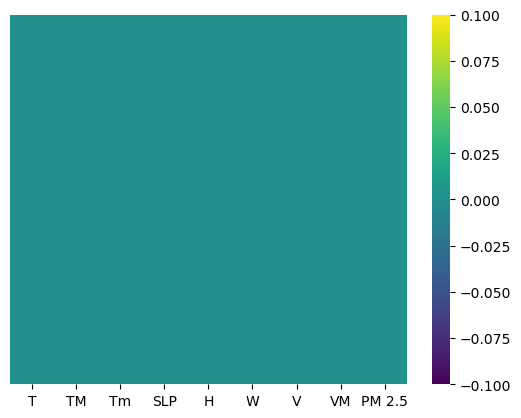

In [8]:
# check for null values
sns.heatmap(df.isnull(), yticklabels= False , cbar = True, cmap= 'viridis')
df.dropna()

In [9]:
df.corr()

,T,TM,Tm,SLP,H,W,V,VM,PM 2.5
T,1.000000,0.967536,0.953719,-0.881409,-0.509299,0.640792,0.301994,0.287738,-0.631462
TM,0.967536,1.000000,0.892031,-0.822958,-0.586681,0.606945,0.292949,0.297011,-0.568409
Tm,0.953719,0.892031,1.000000,-0.917518,-0.287357,0.577240,0.296225,0.266782,-0.673824
SLP,-0.881409,-0.822958,-0.917518,1.000000,0.240256,-0.517915,-0.329838,-0.310704,0.623187
H,-0.509299,-0.586681,-0.287357,0.240256,1.000000,-0.465374,-0.380575,-0.362177,0.138005
W,0.640792,0.606945,0.577240,-0.517915,-0.465374,1.000000,0.376873,0.342442,-0.573941
V,0.301994,0.292949,0.296225,-0.329838,-0.380575,0.376873,1.000000,0.775655,-0.268530
VM,0.287738,0.297011,0.266782,-0.310704,-0.362177,0.342442,0.775655,1.000000,-0.215854
PM 2.5,-0.631462,-0.568409,-0.673824,0.623187,0.138005,-0.573941,-0.268530,-0.215854,1.000000


In [45]:
# Divide into independent and dependent 

X = df.iloc[:,:-1]  ##independent 
Y = df.iloc[:,-1]   ## dependent 

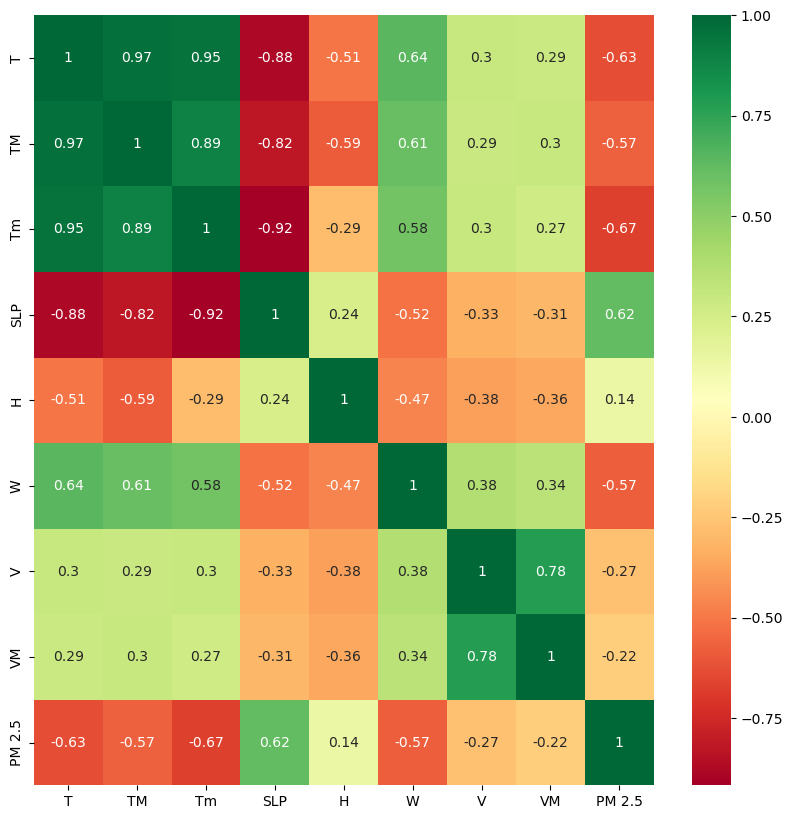

In [12]:
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize = (10,10))
g = sns.heatmap(df[top_corr_features].corr(),annot=True,cmap='RdYlGn')

In [8]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor()
model.fit(X,Y)

ExtraTreesRegressor()

In [9]:
print(model.feature_importances_)

[0.16742936 0.09002595 0.21488256 0.15310536 0.0882213  0.19261104
 0.05142174 0.04230269]


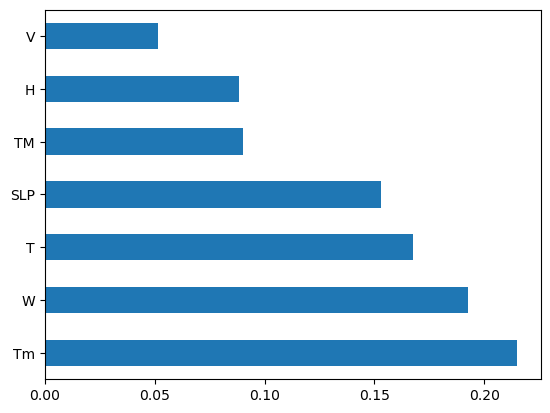

In [10]:
feat_importance = pd.Series(model.feature_importances_,index=X.columns)
feat_importance.nlargest(7).plot(kind='barh')
plt.show()

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

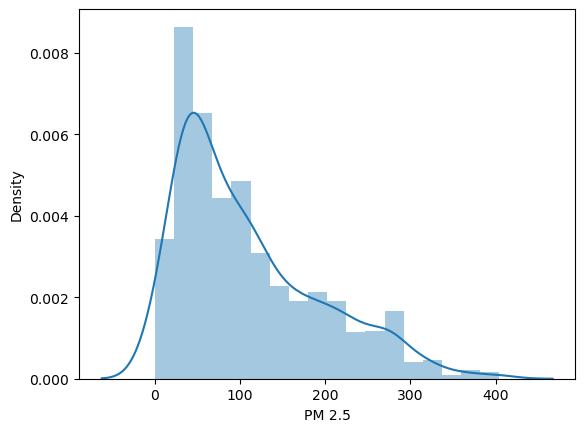

In [11]:
sns.distplot(Y)

In [13]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.3, random_state=0)

In [13]:
from sklearn.linear_model import LinearRegression

In [14]:
regressor = LinearRegression()
regressor.fit(X_train,Y_train)

LinearRegression()

In [15]:
print('Train_set R^2 value {}'.format(regressor.score(X_train,Y_train)))

Train_set R^2 value 0.551516808175875


In [16]:
print('Test_set R^2 value {}'.format(regressor.score(X_test,Y_test)))

Test_set R^2 value 0.48525331308567876


In [17]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(regressor,X,Y,cv=5)

In [18]:
score.mean()

0.4710569304807393

In [19]:
coeff_df = pd.DataFrame(regressor.coef_, X.columns,columns=['Cofficient'])
coeff_df

,Cofficient
T,-2.690908
TM,0.462200
Tm,-3.867052
SLP,-0.044949
H,-1.211936
W,-40.114908
V,-2.535633
VM,0.561482


In [20]:
prediction = regressor.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

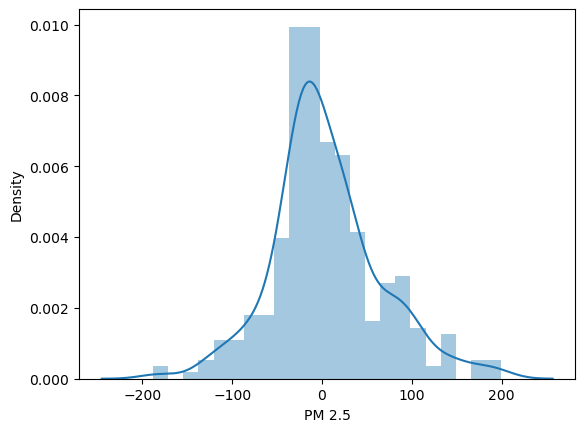

In [21]:
sns.distplot(Y_test-prediction)

In [22]:
from sklearn import metrics

In [23]:
print('MAE', metrics.mean_absolute_error(Y_test,prediction))
print('MSE',metrics.mean_squared_error(Y_test,prediction))
print('RMSE',np.sqrt(metrics.mean_squared_error(Y_test,prediction)))

MAE 44.83624126628639
MSE 3687.5430309324192
RMSE 60.725143317512384


# Compare Linear,Ridge and Lasso Regression


Linear Regression

In [24]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression

# check for error 
lin_regressor = LinearRegression()
mse = cross_val_score(lin_regressor,X,Y,scoring = 'neg_mean_squared_error',cv =5)
mean_mse = np.mean(mse)
print(mean_mse)

-3686.2017773398848


Ridge Regression

In [25]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()
parameter = {'alpha': [1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,50,90]}
ridge_regressor = GridSearchCV(ridge,parameter,scoring = 'neg_mean_squared_error',cv =5)
ridge_regressor.fit(X,Y)


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 0.001, 0.01, 1, 5, 10,
                                   20, 30, 50, 90]},
             scoring='neg_mean_squared_error')

In [26]:
print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

{'alpha': 90}
-3661.878094404676


Lasso Regression 

In [27]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

lasso = Lasso()
parameter = {'alpha': [1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,50,90]}
lasso_regressor = GridSearchCV(lasso,parameter,scoring = 'neg_mean_squared_error',cv =5)
lasso_regressor.fit(X,Y)


print(lasso_regressor.best_params_)
print(lasso_regressor.best_score_)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.444e+06, tolerance: 6.146e+02
  model = cd_fast.enet_coordinate_descent(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.569e+06, tolerance: 6.790e+02
  model = cd_fast.enet_coordinate_descent(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.456e+06, toleranc

{'alpha': 1}
-3666.7832534370186


In [28]:
prediction = lasso_regressor.predict(X_test)

from sklearn import metrics

print('MAE', metrics.mean_absolute_error(Y_test,prediction))
print('MSE',metrics.mean_squared_error(Y_test,prediction))
print('RMSE',np.sqrt(metrics.mean_squared_error(Y_test,prediction)))

MAE 44.50831198875127
MSE 3627.8109390424697
RMSE 60.2313119485411


# DecisionTreeRegression

In [29]:
from sklearn.tree import DecisionTreeRegressor

dtree = DecisionTreeRegressor(criterion='mse')

In [30]:
dtree.fit(X_train,Y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


DecisionTreeRegressor(criterion='mse')

In [31]:
# the results show clean view overfitting 
print('Train_set R^2 value {}'.format(dtree .score(X_train,Y_train)))

print('Test_set R^2 value {}'.format(dtree .score(X_test,Y_test)))

Train_set R^2 value 1.0
Test_set R^2 value 0.7255157275186244


In [32]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(dtree,X,Y,cv=5)
score.mean()

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

0.428581881720123

Tree Visualization 

In [33]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [34]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'W', 'V', 'VM']

In [35]:
dot_data = StringIO()
export_graphviz(
    dtree, 
    out_file = dot_data,
    filled = True, 
    rounded = True,
    special_characters = True
)

graph_1 = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph_1.create_png())

InvocationException: GraphViz's executables not found

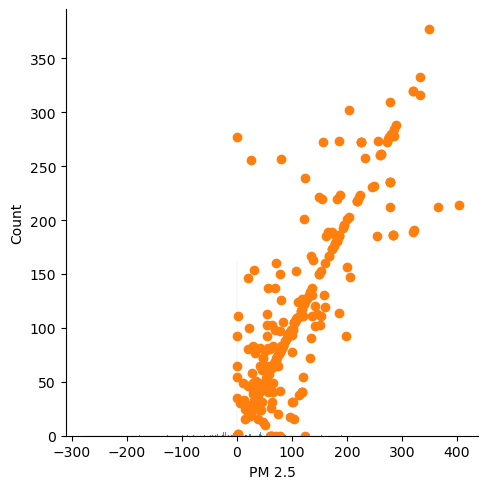

In [37]:
prediction = dtree.predict(X_test)
sns.displot(Y_test-prediction)
plt.scatter(Y_test,prediction)

Hyper-Parameter Tuning Decision Tree Regressor

In [38]:
DecisionTreeRegressor()


parameter = {
    "splitter" : ["best","random"],
    "max_depth" : [3,4,5,6,8,10,12,15],
    "min_samples_leaf" : [0.1,0.2,0.3,0.4,0.5],
    "max_features" : ["auto","log2","sqrt",None],
    "max_leaf_nodes" : [None, 10,20,30,40,50,60,70]
}

In [42]:
from sklearn.model_selection import GridSearchCV

random_search = GridSearchCV(dtree,param_grid = parameter, scoring = 'neg_mean_squared_error',n_jobs =1,cv =10,verbose=3)

In [43]:
def timer(start_time= None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(),3600)
        tmin, tsec = divmod(temp_sec,60)
        print('\n Time Taken:  %i hours %i minutes and %s seconds.' % (thour,tmin, round(tsec,2)))

In [44]:
from datetime import datetime

start_time = timer(None)
random_search.fit(X,Y)
timer(start_time)

Fitting 10 folds for each of 2560 candidates, totalling 25600 fits
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2870.846 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3903.864 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1522.729 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3981.978 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2507.609 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2662.641 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, spli

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4722.101 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5069.270 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3114.092 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4863.711 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-7986.692 total time=   0.0s
[CV 6/10]

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3477.963 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4275.934 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-9218.124 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3281.372 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-7557.599 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6395.494 total time=   0.0s
[CV 1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3903.864 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1522.729 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3981.978 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2507.609 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2662.641 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4508.766 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1082.467 total time=   0.0s
[CV 9/10] END max_depth=3, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=3, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1454.192 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6011.520 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4487.839 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=3, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5070.609 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5106.166 total time=   0.0s
[CV 3/10] END max_depth=3, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5874.725 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-2133.625 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-6395.494 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-4508.766 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1082.467 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3158.112 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4256.891 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3282.372 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1714.306 total time=   0.0s
[CV 4/10] END max_depth=3, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5718.945 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1774.142 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3478.504 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3264.576 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4265.114 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5598.413 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1544.580 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5081.934 total time=   0.0s
[CV 2/10] END max_depth=3, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2870.846 total time=   0.0s
[CV 2/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-7265.242 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-1763.464 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-7999.310 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4861.717 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4997.687 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5104.772 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-2784.615 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5907.676 total time=   0.0s
[CV 5/10] END max_depth=3

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4444.706 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1082.467 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3158.112 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4084.309 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4713.202 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1944.610 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3639.810 total time=   0.0s
[CV 5/10] END max_depth=3

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4208.062 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5410.049 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-2054.069 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6815.394 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4546.199 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4935.592 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2870.846 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3903.864 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1522.729 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3981.978 total time=   0.0s
[CV 5/10] END max_depth=3,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4692.648 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4960.528 total time=   0.0s
[CV 3/10] END max_depth=3, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4965.616 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3940.083 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5585.317 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2375.736 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-6681.073 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4498.586 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-5319.664 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-1646.709 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-5958.292 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3523.682 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3916.460 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5605.163 total time=   0.0s
[CV 3/10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5780.655 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3971.491 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6406.697 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2228.490 total time=   0.0s
[CV 4/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5377.824 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1214.901 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5946.892 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3419.746 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3770.355 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2366.350 total time=   0.0s
[CV 4/10] END max_depth=3,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-7842.206 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4850.520 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5423.606 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5273.850 total time=   0.0s
[CV 5/10] END max_depth=3, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8187.516 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5492.941 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1812.797 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4266.297 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3690.180 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3945.028 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-6142.165 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1642.120 total time=   0.0s
[CV 9/10] END max_depth=3, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4965.375 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3374.529 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-7848.319 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-3125.993 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5777.620 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-6967.627 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=3, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3167.481 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5042.021 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4791.831 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-7158.401 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4679.882 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5274.987 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1787.465 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-2500.566 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3741.341 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5117.379 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1492.872 total time=   0.0s
[CV 9/10] END max_depth=3, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4662.794 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-1630.181 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4679.882 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4688.903 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3345.587 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5137.981 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3090.791 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5190.969 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-7711.063 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4358.876 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5273.850 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-6841.879 total time=   0.0s
[CV 10/10] END max_depth=3, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-3151.693 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3581.102 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5267.669 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1597.961 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5557.957 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2726.582 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3216.816 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5109.861 total time=   0.0s
[CV 8/10] END max_depth=3, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5874.725 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=3, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-1675.959 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6420.442 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4804.071 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4569.717 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1935.994 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5283.984 total time=   0.0s
[CV 5/10] END max_depth=3, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4038.002 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2833.428 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5316.531 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5317.472 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3915.920 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3434.896 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-2538.026 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-6542.085 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3952.964 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5068.128 total time=   0.0s
[CV 3/1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-6661.678 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-2648.975 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3303.301 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5397.229 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1840.480 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-6523.326 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3773.745 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3869.632 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3228.400 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5287.841 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1301.627 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-7387.515 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3536.691 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4473.651 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5575.782 total time=   0.0s
[CV 3/10] END max_depth=3, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1807.209 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5984.628 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3269.238 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4516.445 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5820.383 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4308.666 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3125.993 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-2034.538 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4082.498 total time=   0.0s
[CV 2/10] END max_depth=3, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3913.329 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4992.121 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1514.083 total time=   0.0s
[CV 4/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3721.157 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3485.305 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5813.803 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1783.704 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5934.196 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-9282.245 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-11374.974 total time=   0.0s
[CV 8/10] END max_depth=3, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4926.133 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-1800.449 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4232.390 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-5337.319 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3309.138 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3386.422 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-9619.798 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2085.713 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5044.837 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-9599.782 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-1610.766 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5463.049 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-8862.622 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6967.627 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4496.807 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4522.235 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4527.736 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1806.061 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4289.245 total time=   0.0s
[CV 5/10] END max_depth=3,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-3380.402 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6339.856 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-8774.803 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5814.323 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-8862.622 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6766.576 total time=   0.0s
[CV 10/10] END max_depth=3, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-4218.772 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5312.713 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1728.156 total time=   0.0s
[CV 4/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1658.863 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5720.123 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3897.732 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3306.517 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5487.008 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1554.832 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-6531.716 total time=   0.0s
[CV 10/10] END max_depth=3, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3667.107 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5957.709 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-6718.091 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-6215.525 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6766.576 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6175.420 total time=   0.0s
[CV 5/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3809.449 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4234.845 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3618.361 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5102.720 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-2048.912 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=3, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3847.524 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-2275.744 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3817.312 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4922.074 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-1455.199 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-9130.966 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4355.088 total time=   0.0s
[CV 1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-2271.497 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2276.744 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4666.612 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1998.022 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-7562.697 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-2289.151 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-6696.129 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4208.586 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3426.673 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=3, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5394.363 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6438.079 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-2452.689 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5673.951 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5115.481 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4855.931 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2851.228 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4281.721 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-6451.786 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1285.029 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5875.354 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4484.708 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3952.565 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2900.014 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-7561.091 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1605.133 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6847.528 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3792.624 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5598.435 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3225.374 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-6375.524 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5831.094 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=3

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-3782.067 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-1522.729 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3981.978 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2507.609 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2662.641 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-4508.766 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-1082.467 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=3, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=3, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4527.780 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-5201.780 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3915.920 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-7821.062 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3321.722 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4508.766 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1082.467 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3158.112 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4004.663 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3676.891 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-2139.643 total time=   0.0s
[CV 4/10] END max_depth=3, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-2005.708 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4902.991 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4957.264 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5299.568 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5995.956 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-1596.201 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5609.573 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1760.772 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6221.074 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3177.323 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=3, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4503.029 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10998.165 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3471.770 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=3, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=3,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4508.766 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1082.467 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3158.112 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4445.696 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4641.799 total time=   0.0s
[CV 3/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-2004.135 total time=   0.0s
[CV 4/10] END max_depth=3, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3915.862 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-7520.890 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-2168.540 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6916.159 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4145.742 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8294.626 total time=   0.0s
[CV 3/10] END max_depth=3, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=3, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2877.740 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1557.572 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3990.141 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-3978.239 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5036.892 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-2302.833 total time=   0.0s
[CV 4/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5712.260 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4268.982 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6561.219 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2520.727 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8843.747 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4529.139 total time=   0.0s
[CV 1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1678.258 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-7503.293 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5325.495 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4771.032 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-7410.768 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3089.600 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5896.728 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3468.802 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3990.141 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=4, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3471.319 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5386.740 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-1694.606 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5947.247 total time=   0.0s
[CV 5/10] END max_depth=4

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1999.093 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5856.283 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3213.252 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3946.540 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6252.191 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1703.927 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10799.185 total time=   0.0s
[CV 10/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3779.421 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1728.317 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3467.698 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2388.294 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3639.906 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5720.809 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1530.706 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2877.740 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-1557.572 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3990.141 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5217.516 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4692.194 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-1671.560 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3468.835 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3529.471 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4450.683 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-6997.996 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-3739.570 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=4, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-1464.277 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5944.941 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4155.026 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=4, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4272.599 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-7770.164 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-2327.181 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5592.334 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-3903.851 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4229.314 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-11185.203 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2877.740 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1557.572 total time=   0.0s
[CV 4/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4717.910 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4662.794 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6070.410 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2877.740 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1557.572 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3990.141 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4368.789 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5224.777 total time=   0.0s
[CV 3/10] END max_depth=4, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2997.326 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-6394.356 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5028.652 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5817.279 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3121.818 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-6793.593 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-5447.913 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-2577.149 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-6822.741 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3821.366 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3331.045 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-6896.991 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-1932.321 total time=   0.0s
[CV 9/

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5444.009 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3364.662 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5565.470 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-6967.627 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4956.368 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4267.482 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3070.794 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3957.822 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1879.102 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3886.867 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3814.821 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3161.460 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5740.461 total time=   0.0s
[CV 8/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1783.704 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5920.547 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3454.908 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3893.087 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4961.686 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1977.372 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6325.558 total time=   0.0s
[CV 5/10] END max_depth=4

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-6254.716 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4266.988 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3923.190 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5842.302 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1365.251 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-6547.261 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3538.063 total time=   0.0s
[CV 1/10] END max_depth=4, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3557.951 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-6916.872 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4709.528 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-8514.264 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1959.788 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8698.900 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-1827.539 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-6556.063 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-4305.796 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-9247.110 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2177.654 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3002.332 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5558.222 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=4, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-6164.932 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-6863.428 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-3340.129 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=4

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1662.778 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5238.169 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3651.285 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3644.851 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1238.758 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=4, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-2394.465 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-7310.904 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-2837.353 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6621.371 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4042.880 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5769.499 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4279.950 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-1845.726 total time=   0.0s
[CV 9/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5598.933 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2921.261 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3020.373 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5287.644 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1150.997 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5532.053 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3541.540 total time=   0.0s
[CV 1/10] END max_depth=4, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1797.298 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5634.117 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-8223.541 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3624.521 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6532.694 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4486.409 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-7286.806 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5558.222 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-2034.538 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-6967.627 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=4, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2244.825 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5438.388 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1485.867 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4354.627 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3591.838 total time=   0.0s
[CV 6/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-10998.165 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5792.189 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-8294.626 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3461.862 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-6104.443 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1638.183 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-6657.327 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4092.135 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4538.166 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5543.609 total time=   0.0s
[CV 3/10] END max_depth=4, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10935.872 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=4,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4523.984 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4840.928 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1802.374 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5238.169 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3105.392 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3643.232 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-7344.552 total time=   0.0s
[CV 8/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4412.518 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1706.716 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-4724.272 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-2063.899 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5256.331 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3617.116 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-7181.825 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1492.872 total time=   0.0s
[CV 9/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-6021.595 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5987.750 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5750.585 total time=   0.0s
[CV 8/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4633.555 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2043.331 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4665.306 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4786.378 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3102.236 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-6106.888 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1375.611 total time=   0.0s
[CV 9/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-3144.093 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6354.894 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-1704.987 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6911.736 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-7049.347 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6395.494 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6673.857 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-4587.332 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1751.448 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5618.260 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3673.307 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3960.925 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5378.258 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1125.184 total time=   0.0s
[CV 9/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3597.818 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4931.299 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3869.964 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6967.307 total time=   0.0s
[CV 10/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5814.323 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3125.993 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-8862.622 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1840.480 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-9026.613 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=4, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4316.130 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4923.163 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1959.816 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-7293.482 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3970.483 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4398.994 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3496.618 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5874.725 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1840.480 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-11020.691 total time=   0.0s
[CV 10/10] END max_depth=4, max_f

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2877.740 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1557.572 total time=   0.0s
[CV 4/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3665.351 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1692.465 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6523.852 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4147.867 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3583.823 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5106.580 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1240.253 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6643.581 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3494.455 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=4, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4597.215 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-2286.698 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-6106.326 total time=   0.0s
[CV 5/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2877.740 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1557.572 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3990.141 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=4, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4738.335 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5055.828 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-2286.698 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3079.099 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3920.200 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6092.166 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4385.197 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-7263.486 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4536.121 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5482.730 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1947.734 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5322.612 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3371.108 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3495.624 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-6030.529 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1326.200 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=4, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-4219.539 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5533.361 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-2418.569 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5994.458 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5141.720 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5501.064 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-1872.964 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5779.253 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5505.602 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3356.663 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5571.567 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-1869.669 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=4, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=4, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5185.785 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-1962.331 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3077.321 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4806.431 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5800.944 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-1584.082 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5526.641 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3564.031 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3456.329 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5707.751 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1591.425 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6089.948 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3531.602 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3765.701 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=4, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-2515.894 total time=   0.0s
[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-3604.881 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5506.222 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-1230.947 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-7917.504 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5453.533 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4234.172 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-7420.789 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-2175.961 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6896.967 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3740.628 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=4, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=4,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4180.150 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-5155.191 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-2013.579 total time=   0.0s
[CV 4/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4205.050 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4734.708 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-2335.164 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-6502.392 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-3447.657 total time=   0.0s
[CV 6/10]

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-1644.635 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5939.702 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4412.518 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3318.598 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2143.507 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-9026.613 total time=   0.0s
[CV 10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-1971.355 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4874.331 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3722.416 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4430.702 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5448.758 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1686.803 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6683.494 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3655.283 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2022.312 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-7381.167 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4139.182 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=5, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=5, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1997.278 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6507.299 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-2806.884 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3525.473 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6453.997 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1484.125 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-7160.266 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-7514.373 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-1628.398 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-6355.958 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=5, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4745.924 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4970.665 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5507.962 total time=   0.0s
[CV 5/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-11421.823 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-2543.601 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-3760.738 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3509.544 total time=   0.0s
[CV 2/10] END max_depth=5, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4511.995 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5448.992 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2386.082 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5218.801 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3252.113 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-8862.622 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-1636.247 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-7092.429 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4832.120 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4745.932 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3137.589 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3618.178 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5565.581 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-1212.153 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-6587.763 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3600.612 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-9726.926 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-2466.547 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=5,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3435.842 total time=   0.0s
[CV 2/10] END max_depth=5, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4936.100 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-2926.060 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4884.189 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-7986.692 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4969.630 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-6116.702 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-2281.725 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-2914.394 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5342.313 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-2128.287 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5093.480 total time=   0.0s
[CV 5/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1977.058 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-7445.748 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-9043.321 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=5, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4709.528 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2954.855 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5877.722 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3924.451 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4245.207 total time=   0.0s
[CV 7/

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5550.861 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10566.626 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3717.543 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3558.382 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4924.781 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1565.239 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4324.882 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3652.511 total time=   0.0s
[CV 6/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-2888.219 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5605.163 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1762.001 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3210.487 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-2500.566 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3741.341 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5567.753 total time=   0.0s
[CV 8/10] END max_depth=5, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-6468.173 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4253.347 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3393.868 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-6021.595 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3773.745 total time=   0.0s
[CV 1/10] END max_depth=5, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3284.830 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3423.914 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-5992.069 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1738.655 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-7557.713 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3515.396 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-2654.612 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4146.328 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5663.130 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-2100.953 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4873.804 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4433.265 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5753.716 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=5,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1119.416 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5728.233 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3729.436 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2608.940 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4224.949 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2137.172 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5394.363 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-7178.218 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1536.624 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2852.386 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-3125.993 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-11374.974 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=5, max_f

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4750.314 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4072.272 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5975.526 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2072.303 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-7695.011 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4283.769 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-7971.507 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5273.850 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4253.347 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-6025.517 total time=   0.0s
[CV 8/10] END max_depth=5, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3605.238 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4836.984 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1715.982 total time=   0.0s
[CV 4/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4786.850 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-2901.310 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5903.620 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1571.064 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5311.423 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3199.368 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3406.640 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5868.578 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1119.005 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-6147.530 total time=   0.0s
[CV 10/10] END max_depth=5, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5214.193 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1318.694 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-6008.642 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4604.214 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4010.718 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5259.747 total time=   0.0s
[CV 3/10] END max_depth=5, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5678.805 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-2162.046 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-9291.944 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-6002.001 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3650.583 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4573.688 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5435.272 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-1808.440 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5753.835 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-2906.373 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5734.741 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8223.541 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4731.032 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4883.157 total time=   0.0s
[CV 3/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5469.235 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-2693.934 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3721.966 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-6379.791 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-2656.668 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-6851.155 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4329.176 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5826.375 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6894.789 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-9564.468 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6440.149 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4248.563 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5094.735 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3654.054 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-9846.651 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2305.714 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5762.101 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4240.635 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-7852.283 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5463.049 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1840.480 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6395.494 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4250.236 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5235.789 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1787.803 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5561.758 total time=   0.0s
[CV 5/10] END max_depth=5,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1762.423 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5863.464 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3552.649 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5792.189 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5612.877 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3184.961 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4349.074 total time=   0.0s
[CV 5/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-8294.626 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4614.065 total time=   0.0s
[CV 5/10] END max_depth=5,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-4001.549 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5605.163 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-2021.133 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5276.334 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3915.821 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3752.357 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-7308.155 total time=   0.0s
[CV 8/10] END max_depth=5, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5780.655 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-2322.423 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-6662.475 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3758.442 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-1653.613 total time=   0.0s
[CV 4/10] END max_depth=5,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5645.105 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1966.138 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-6794.449 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4473.030 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-1864.017 total time=   0.0s
[CV 4/10] END max_depth=5,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-6811.814 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-2005.788 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-3063.263 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5335.263 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3039.677 total time=   0.0s
[CV 9/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4938.650 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5302.721 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1789.396 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3735.809 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2660.832 total time=   0.0s
[CV 6/10] END max_depth=5, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5117.794 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-6535.216 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-2021.133 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5238.169 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4608.783 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3875.949 total time=   0.0s
[CV 7/10] END max_depth=5, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4898.898 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5750.585 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-8855.384 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4709.528 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4337.235 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4614.065 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8166.732 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4254.116 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10972.608 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3520.343 total time=   0.0s
[CV 2/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6303.064 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4687.773 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3655.697 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-2021.133 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5244.766 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-2632.713 total time=   0.0s
[CV 6/10] END max_depth=5, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5511.598 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-2648.975 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3885.683 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-6227.183 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-6899.191 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5356.683 total time=   0.0s
[CV 1/10] END max_depth=5, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-9043.321 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4759.795 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5268.511 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4543.809 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6503.018 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-9145.491 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-1898.951 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6770.966 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-2726.240 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-9726.926 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4267.482 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4614.065 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-7702.073 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3915.920 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5777.620 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1840.480 total time=   0.0s
[CV 9/10] END max_depth=5, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3739.954 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3914.246 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-5450.102 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-1370.129 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-6121.733 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4814.613 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1672.248 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5784.776 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3489.465 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3457.005 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6597.769 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1516.275 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5710.056 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5091.542 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3317.378 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3323.950 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5416.214 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1986.309 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6261.535 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3693.182 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4725.995 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-6583.676 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-1786.485 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-3843.217 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5549.017 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-1630.111 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4908.850 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-2704.432 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4103.372 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5777.933 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-1759.717 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5804.995 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3283.057 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3250.596 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6085.302 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-7487.733 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4217.077 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4443.945 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4111.446 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2333.058 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-6074.305 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2787.506 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3579.687 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5516.170 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1929.120 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5564.710 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5262.895 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3951.444 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5597.069 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3066.216 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5013.941 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3638.057 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3905.294 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-6845.566 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-3739.570 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2173.795 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4775.237 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2769.786 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5119.342 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5796.632 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-1627.036 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6906.644 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-6261.917 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-5117.835 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=5, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3816.493 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-6645.294 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-2300.016 total time=   0.0s
[CV 4/10] END max_depth=5, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4471.201 total time=   0.0s
[CV 2/10] END max_depth=5, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=5, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4695.449 total time=   0.0s
[CV 2/10] END max_depth=5, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-2768.072 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3116.410 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5529.941 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1423.800 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6533.221 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3250.294 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3650.082 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5891.492 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-1531.314 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8129.613 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5831.094 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-6085.773 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5332.121 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=5, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6996.425 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1796.886 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-7401.721 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5549.591 total time=   0.0s
[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=5

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=5, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=5, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3836.149 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-5269.274 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-2015.933 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-6315.286 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3947.044 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10]

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5024.308 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2494.943 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3454.447 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5797.326 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1375.167 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-7151.330 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3772.457 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5452.266 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-7361.023 total time=   0.0s
[CV 3/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1979.173 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-5564.781 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3706.880 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4327.198 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-5036.478 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1537.466 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6322.764 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3474.645 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6375.524 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4569.280 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8037.713 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-9305.863 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4743.181 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5507.719 total time=   0.0s
[CV 3/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3979.051 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5082.595 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-2467.768 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-6240.092 total time=   0.0s
[CV 5/10] END max_depth=6

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-2848.776 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5981.308 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-3583.969 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-6133.361 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-6969.267 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4106.923 total time=   0.0s
[CV 2/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4725.369 total time=   0.0s
[CV 3/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-1974.568 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5037.159 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3292.992 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4339.148 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6033.977 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-1800.735 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6117.996 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4280.704 total time=   0.0s
[CV 2/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4144.709 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8401.812 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-2037.603 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3894.845 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5960.270 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-1835.975 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3691.598 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4342.908 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5344.777 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4359.024 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10998.165 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3701.416 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-2400.392 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4749.076 total time=   0.0s
[CV 3/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2619.598 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5609.866 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4843.402 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-7555.147 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2563.716 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3415.426 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4246.912 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-5470.637 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-1781.401 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3684.472 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3322.909 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4654.440 total time=   0.0s
[CV 7/1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-9965.132 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-2681.669 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5352.293 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-3566.364 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5813.948 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-3067.119 total time=   0.0s
[CV 9/

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4697.223 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-9039.652 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3084.136 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8195.762 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3688.420 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5753.716 total time=   0.0s
[CV 3/10]

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1499.339 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5839.851 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3192.202 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3884.157 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1837.633 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5337.553 total time=   0.0s
[CV 5/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4871.649 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6538.687 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1973.410 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5721.373 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5085.885 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3757.768 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6075.743 total time=   0.0s
[CV 8/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4395.002 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-11405.186 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-2309.487 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4679.882 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2807.185 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3424.578 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5568.276 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1243.154 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5810.852 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3116.108 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4312.739 total time=   0.0s
[CV 2/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3480.337 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5117.379 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-6708.413 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3282.196 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5630.052 total time=   0.0s
[CV 3/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5397.229 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-6079.371 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5087.301 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-2874.211 total time=   0.0s
[CV 4/10] END max_depth=6, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-3977.394 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5815.263 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5741.192 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3681.350 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-4861.335 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2002.368 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-4139.681 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2967.979 total time=   0.0s
[CV 6/10] END max_depth=6, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4464.400 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5681.867 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3328.171 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-4699.564 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1971.142 total time=   0.0s
[CV 4/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-6739.482 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4695.042 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-2338.195 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4874.331 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3531.447 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10935.872 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5934.196 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3285.925 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3952.463 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6965.655 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2142.439 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-2551.521 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4276.213 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5792.189 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=6,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3754.196 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4141.835 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5080.815 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-2958.880 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4948.239 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3255.344 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3456.428 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3427.889 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4194.448 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5565.069 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-1944.398 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-3083.287 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5958.321 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6890.384 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3127.977 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3109.978 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5042.452 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1213.770 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5854.426 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3435.266 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4564.936 total time=   0.0s
[CV 2/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5205.977 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-1870.485 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6077.590 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5090.803 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-2192.423 total time=   0.0s
[CV 9/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-9292.329 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4812.372 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2538.428 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-6001.953 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1088.251 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-6311.984 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3641.586 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4448.837 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-7697.023 total time=   0.0s
[CV 3/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3764.116 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5025.164 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3313.493 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6106.326 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3539.360 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-1861.585 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3149.984 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4596.516 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3136.498 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-11272.600 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10551.651 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4623.788 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4812.372 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5927.803 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2443.948 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3196.000 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5793.297 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1230.179 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-7154.621 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3233.697 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5641.385 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3528.698 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-9530.677 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3869.964 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6558.523 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-1807.038 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-7624.157 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3782.067 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2737.282 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5888.931 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6557.576 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4997.702 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3845.707 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5406.363 total time=   0.0s
[CV 3/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4614.065 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5777.620 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=6, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1789.312 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-6310.112 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3792.333 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3634.909 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-6224.319 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1556.198 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-6795.872 total time=   0.0s
[CV 10/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-2792.044 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3212.168 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5100.088 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1748.103 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3907.963 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2616.583 total time=   0.0s
[CV 6/10] END max_depth=6, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-6720.758 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3207.014 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5177.963 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3300.909 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-9218.124 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-1849.329 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4679.882 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5554.318 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2731.831 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-7207.901 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2674.979 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2201.776 total time=   0.0s
[CV 9/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5285.944 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-9731.302 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=6, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-2439.984 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5472.922 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4667.354 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1855.799 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5712.784 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3636.300 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3993.873 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5301.874 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1149.283 total time=   0.0s
[CV 9/10] END max_depth=6, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3363.473 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5804.974 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1358.745 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-6784.225 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3764.116 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-3929.637 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-2322.423 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-6523.326 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3679.197 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5587.153 total time=   0.0s
[CV 5/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3230.080 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3822.615 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1987.018 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5974.899 total time=   0.0s
[CV 5/10] END max_depth=6,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-6779.240 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4586.436 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5405.399 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-2865.316 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6604.255 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-1883.856 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5859.186 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-8192.106 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-11188.604 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5934.196 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4410.090 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3760.016 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6816.705 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3122.080 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3605.911 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-8774.127 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4474.229 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_f

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4531.294 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4563.905 total time=   0.0s
[CV 3/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-3842.739 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5256.172 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-1944.411 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4792.483 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4142.419 total time=   0.0s
[CV 6/10]

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3487.513 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5740.213 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-1630.181 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6950.965 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3788.492 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10]

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3844.554 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4705.501 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2360.173 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4992.434 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-3704.536 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=6,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4266.722 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5662.948 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-1820.182 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5791.796 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3348.351 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5549.937 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3714.373 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4012.754 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-8978.777 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1557.836 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-7006.682 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6176.062 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4278.823 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4789.256 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1859.516 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4093.431 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2908.569 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3474.777 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1860.249 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6001.761 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4515.180 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4399.358 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5692.522 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1829.999 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-8675.412 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4994.531 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=6, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5926.735 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3989.242 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=6, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4937.331 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3898.982 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3704.813 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4367.907 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-1413.535 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-6665.267 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3714.270 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=6, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=6, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=6, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3904.290 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-8652.803 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-2242.524 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5939.702 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3417.369 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3533.104 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3490.560 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6005.934 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-1821.555 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6995.390 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4247.647 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=6, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3084.734 total time=   0.0s
[CV 2/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-9794.028 total time=   0.0s
[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2416.656 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5934.784 total time=   0.0s
[CV 5/10] END max_depth=6

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5776.627 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6990.622 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=6, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10116.806 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-1964.354 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5883.349 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3483.282 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5028.652 total time=   0.0s
[CV 7/

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8514.264 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5632.541 total time=   0.0s
[CV 5/10] END max_depth=8

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1178.478 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6067.560 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3862.383 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=8, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=8, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=8, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3941.237 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1628.932 total time=   0.0s
[CV 4/10] END max_depth=8,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4148.815 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-9682.991 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3166.672 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5935.308 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5971.657 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3098.421 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-2396.835 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-8277.154 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-6868.966 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4476.681 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5218.824 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3193.942 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6973.462 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3409.630 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3715.411 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-3856.540 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5951.631 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3379.090 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3367.174 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-6079.170 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-1749.766 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-6221.490 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4082.467 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=8, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5098.743 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3260.331 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=8, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4872.387 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5458.172 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-1971.355 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3483.282 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-1588.244 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5867.250 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-3726.603 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=8, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4728.449 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-3070.945 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-3755.700 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-3905.294 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6126.738 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4199.498 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3649.372 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1667.909 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4424.125 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2662.070 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3444.829 total time=   0.0s
[CV 7/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5395.925 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5144.209 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5866.743 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2040.937 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-11043.078 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4812.372 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1550.813 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4317.458 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2285.764 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2996.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5234.453 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1085.268 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5719.277 total time=   0.0s
[CV 10/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5267.462 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5381.863 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3885.207 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5646.971 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1473.478 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-6715.221 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4138.024 total time=   0.0s
[CV 1/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3885.683 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5397.229 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-6021.595 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4970.665 total time=   0.0s
[CV 3/10] END max_depth=8, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5323.392 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2803.354 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3744.072 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1428.973 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5198.154 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3532.985 total time=   0.0s
[CV 6/10] END max_depth=8, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5382.322 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-2002.057 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5228.338 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-2610.212 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4036.746 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5217.886 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-2045.861 total time=   0.0s
[CV 9/10] END max_depth=8, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5934.623 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3034.440 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5730.643 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4196.927 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-2911.329 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-1863.972 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10541.489 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8680.498 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6083.752 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3193.202 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6718.340 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5175.638 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2798.699 total time=   0.0s
[CV 9/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-7820.764 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-6650.036 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3906.421 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4501.852 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1689.565 total time=   0.0s
[CV 4/10] END max_depth=8

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5567.083 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5780.655 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-6021.595 total time=   0.0s
[CV 10/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-2932.011 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-7719.981 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-11406.449 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4175.719 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4380.517 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1613.573 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5110.914 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2881.072 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3056.852 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5101.466 total time=   0.0s
[CV 8/10] END max_depth=8, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5217.886 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1818.531 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-6701.954 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3970.483 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5185.785 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-2865.316 total time=   0.0s
[CV 4/10] END max_depth=8, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-1841.346 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6777.213 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6395.494 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6878.554 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6495.755 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-1773.168 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6133.749 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5874.725 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1562.869 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-6779.240 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4477.603 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-8923.992 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1735.856 total time=   0.0s
[CV 4/10] END max_depth=8, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-6651.108 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5483.585 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-2933.170 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4614.065 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4331.410 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6464.335 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4319.205 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5319.592 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1973.562 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4562.379 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2401.427 total time=   0.0s
[CV 6/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3721.157 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3345.511 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-6104.443 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1509.126 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-7778.468 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4071.202 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6324.583 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6550.072 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3059.387 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6644.216 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-1790.838 total time=   0.0s
[CV 9/

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5958.825 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2012.566 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5648.299 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4976.271 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2953.986 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2588.718 total time=   0.0s
[CV 4/10] END max_depth=8,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5580.496 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2931.758 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-6355.756 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-2807.274 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8293.169 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-6395.494 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-4812.372 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3224.556 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5492.209 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1111.136 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5744.634 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3239.622 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4622.505 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5916.258 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3672.295 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3680.302 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4878.752 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4750.647 total time=   0.0s
[CV 6/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3313.945 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5483.045 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1172.370 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-6008.037 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3181.160 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-8294.626 total time=   0.0s
[CV 3/10] END max_depth=8, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2996.329 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5636.529 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5996.531 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5094.795 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6620.156 total time=   0.0s
[CV 8/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5517.515 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5550.861 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-6766.576 total time=   0.0s
[CV 10/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-6659.095 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1718.497 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-8494.813 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3937.191 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4963.997 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5391.082 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1725.583 total time=   0.0s
[CV 4/10] END max_depth=8

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5266.273 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5957.709 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-6523.326 total time=   0.0s
[CV 10/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-8680.498 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5129.622 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-9378.616 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5905.236 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3077.321 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5823.003 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4080.873 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5432.419 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1855.229 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5239.862 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-2610.212 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3240.053 total time=   0.0s
[CV 7/10] END max_depth=8, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-7404.926 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-8597.478 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_f

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-1757.631 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5340.799 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-11216.468 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5814.323 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5777.620 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3485.305 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-6067.996 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1492.872 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-6611.255 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4275.526 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4812.372 total time=   0.0s
[CV 2/10] END max_depth=8, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-6762.973 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4496.807 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3443.560 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-7719.981 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4420.662 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5442.271 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-1798.284 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4282.800 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8100.059 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3741.234 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4993.556 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1783.054 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5772.741 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2958.335 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3671.810 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5699.412 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1587.136 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6720.806 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3675.602 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3548.488 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5701.365 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2042.721 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6573.876 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3713.356 total time=   0.0s
[CV 1/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4182.291 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-5655.347 total time=   0.0s
[CV 3/10] END max_depth=8, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3907.313 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5631.669 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-2123.327 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5755.420 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5138.009 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4168.253 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1700.629 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5650.448 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-2935.025 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6153.738 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1585.762 total time=   0.0s
[CV 9/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5333.150 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1729.868 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2342.817 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3201.062 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3507.002 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5547.656 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2413.589 total time=   0.0s
[CV 9/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4863.984 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-2894.448 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5608.366 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4016.313 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4306.902 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-11399.069 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4283.120 total time=   0.0s
[CV 9/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-3690.180 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3009.046 total time=   0.0s
[CV 2/10] END max_depth=8, max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3200.318 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6674.267 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2438.757 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4373.039 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4479.625 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3092.881 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-4267.482 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-5892.156 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-3566.595 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-2876.324 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-5479.836 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-2034.538 total time=   0.0s
[CV 9/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5998.470 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-1557.836 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-7021.581 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=8, max_fe

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4305.086 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5186.435 total time=   0.0s
[CV 3/10] END max_depth=8, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4200.604 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5025.164 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-2833.428 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5712.260 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1526.874 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6524.748 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3990.362 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=8, 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6831.235 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3761.047 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=8, ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=8, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3779.537 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5821.807 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1520.947 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-6696.826 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3770.621 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=8, max_fea

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=8, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-7656.202 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-1674.085 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5495.429 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-3005.698 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5232.574 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5867.367 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-1865.340 total time=   0.0s

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-7562.697 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2360.206 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-10413.635 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3952.506 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3911.195 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4923.711 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3096.521 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5924.842 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5595.551 total time=   0.0s
[CV 8/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5792.189 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-2867.235 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5261.842 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-3280.240 total time=   0.0s
[CV 6/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-6310.902 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1637.651 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-6406.854 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3679.649 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4950.682 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3468.490 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-6281.605 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1468.128 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-6561.854 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4266.883 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4143.533 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4998.212 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-1759.704 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4949.779 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-2532.502 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-3603.260 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6407.546 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-1516.207 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4601.344 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4306.902 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5579.010 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-1539.217 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-8271.344 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5549.591 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4540.963 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4496.652 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5851.543 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-1734.086 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5511.292 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3888.588 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3530.269 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5542.824 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-1845.726 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-8605.753 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-6956.121 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-8928.973 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2764.611 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5954.441 total time=   0.0s
[CV 5/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5344.386 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10998.165 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3351.572 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4845.120 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1629.140 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4932.500 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2242.641 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3306.745 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5523.733 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-6762.973 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5090.733 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4684.456 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3024.511 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4721.946 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5998.470 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3635.602 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4702.872 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1703.187 total time=   0.0s
[CV 4/10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3407.342 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3062.659 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4834.567 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1684.531 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3639.898 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3764.250 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5565.470 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-2201.973 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-6662.475 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5140.742 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-1700.629 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3010.795 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4599.767 total time=   0.0s
[CV 3/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4699.564 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1771.743 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3913.659 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3461.862 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-7192.786 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1453.941 total time=   0.0s
[CV 9/10] END max_depth=10,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5397.229 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-6956.343 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3758.442 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4221.962 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-2954.855 total time=   0.0s
[CV 4/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-4657.300 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-5701.136 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-2097.072 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4306.843 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5546.635 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1702.120 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5814.606 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-8071.424 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2920.020 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-11600.343 total time=   0.0s
[CV 8/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5193.009 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-7113.217 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5052.301 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8862.622 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4334.740 total time=   0.0s
[CV 1/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3384.156 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4236.726 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-11408.315 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2103.700 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2048.912 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4284.774 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5777.620 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5200.895 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-1702.085 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-7464.030 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3713.132 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4501.852 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5488.515 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1658.863 total time=   0.0s
[CV 4/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5286.867 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3885.683 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-6126.147 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-6863.027 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3758.442 total time=   0.0s
[CV 1/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6967.627 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-3068.106 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5870.515 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3879.886 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5526.016 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1980.044 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-7371.249 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-7216.309 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3774.914 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5423.606 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3287.964 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4003.111 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5753.716 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5814.323 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-8597.478 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6558.523 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=10,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5203.121 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5175.477 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5611.072 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-10566.675 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5780.590 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5567.083 total time=   0.0s
[CV 5/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3817.978 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1750.372 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3417.552 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2353.748 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3335.723 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5097.145 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1266.231 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-2899.916 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5869.983 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5389.876 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3517.382 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5880.010 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1563.689 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-7389.673 total time=   0.0s
[CV 10/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1123.181 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-6263.281 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3640.670 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3234.074 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4924.554 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2085.632 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3045.579 total time=   0.0s
[CV 5/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3427.889 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4757.111 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1975.523 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6000.874 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-3025.519 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-5269.628 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-1869.150 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-9551.607 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-3839.825 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-6438.199 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5230.741 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6513.039 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1559.298 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-7412.872 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-9026.613 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5499.983 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-2048.912 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5987.750 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4688.521 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-11374.974 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-2034.538 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-11020.691 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-2452.689 total time=   0.0s
[CV 4/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3234.604 total time=   0.0s
[CV 2/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5517.515 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8374.111 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5773.339 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-7338.930 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5440.369 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1615.233 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2537.517 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4103.522 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5739.788 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-3890.824 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5423.606 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3305.643 total time=   0.0s
[CV 4/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5792.189 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4679.882 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5517.515 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5777.620 total time=   0.0s
[CV 8/10] END max_depth=10,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5808.201 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-4105.426 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-6955.897 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3724.891 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-6294.865 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3482.433 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6094.704 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5537.325 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1923.145 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5273.850 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4688.521 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3885.683 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5874.725 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-2034.538 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3145.802 total time=   0.0s
[CV 2/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5492.818 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3323.136 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3240.053 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5864.268 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-2909.300 total time=   0.0s
[CV 9/10] END max_depth=10,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5730.643 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5342.851 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-1719.288 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-6643.559 total time=   0.0s
[CV 10/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-7214.550 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6742.739 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4388.953 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4057.180 total time=   0.0s
[CV 2/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5756.844 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-2648.975 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-3393.868 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5817.776 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-6916.872 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4496.807 total time=   0.0s
[CV 1/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6033.977 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4812.372 total time=   0.0s
[CV 2/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2869.429 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5683.585 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3211.118 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4246.845 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6047.365 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2375.736 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-8717.573 total time=   0.0s

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-3445.782 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4428.650 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1874.369 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4557.154 total time=   0.0s
[CV 5/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2519.025 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5841.621 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3269.774 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4104.561 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6005.733 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1700.878 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6854.196 total time=   0.0s
[CV 10/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4415.924 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6284.630 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1820.090 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6949.559 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3789.957 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1848.509 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4192.863 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3596.995 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3008.183 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5250.923 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1342.753 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-6342.294 total time=   0.0s
[CV 10/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4289.675 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-7053.664 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1546.016 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6828.470 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3818.848 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4768.756 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1585.957 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3817.773 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2500.993 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3602.133 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5252.758 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1286.176 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6987.988 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-1389.675 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-7066.293 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3839.817 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6983.540 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3686.601 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4961.213 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1401.726 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5978.036 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3979.289 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5148.912 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3636.812 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5480.520 total time=   0.0s
[CV 5/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-3588.780 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4722.101 total time=   0.0s
[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5501.982 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2171.497 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-2230.789 total time=   0.0s
[CV 4/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-3409.866 total time=   0.0s
[CV 6/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6558.523 total time=   0.0s
[CV 8/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-2370.963 total time=   0.0s
[CV 9/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=10, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5095.164 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4866.657 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-2579.419 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5626.346 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3993.420 total time=   0.0s
[C

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3686.662 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5167.956 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6054.874 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6921.429 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=12

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5114.073 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-9089.959 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2387.686 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5918.728 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4295.318 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4041.316 total time=   0.0s
[CV 7/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4134.139 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-1751.929 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-5323.707 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-2648.975 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4148.601 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-7597.374 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3968.120 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4212.991 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4080.161 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-6052.962 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4711.631 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6541.963 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1998.244 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5911.011 total time=   0.0s
[CV 5/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-6868.966 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3923.741 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5501.982 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1998.933 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5814.606 total time=   0.0s
[CV 5/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4412.518 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5322.256 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-5745.712 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-2563.716 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-6778.363 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4679.587 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3050.817 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5025.413 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1697.347 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3705.581 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3677.564 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3130.255 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5720.065 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2914.997 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4937.331 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4875.488 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-2840.738 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5603.921 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4009.941 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5156.349 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-2480.040 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5900.712 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-3931.334 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4199.596 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5220.663 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-2805.669 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5556.471 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4444.706 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6838.967 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-2274.358 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3604.276 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5866.073 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-1615.355 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-7103.642 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-8575.711 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-6771.204 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3741.234 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4995.131 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-2105.574 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5856.283 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5103.466 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4304.809 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5744.374 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1873.159 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5325.194 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3556.239 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1840.480 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-6523.326 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3772.941 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4194.448 total time=   0.0s
[CV 2/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-2500.566 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3588.779 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-6218.716 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-6720.758 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4145.439 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-2048.912 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1755.184 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-7071.352 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6456.800 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-2436.369 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4760.038 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1819.269 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5268.327 total time=   0.0s
[CV 5/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-4752.226 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-6257.627 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1078.138 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-6200.469 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3318.064 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4441.603 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5132.292 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1549.382 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3432.871 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4860.569 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5254.002 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4965.616 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4958.098 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4267.482 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5792.189 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5814.323 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5557.496 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-1822.489 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3160.442 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3331.271 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3454.933 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-5277.290 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3405.877 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4842.219 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-1972.825 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3521.890 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5486.877 total time=   0.0s
[CV 8/10] END max_depth=12,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-3693.843 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6054.874 total time=   0.0s
[CV 8/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3473.756 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5235.823 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1277.284 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-6708.413 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4250.097 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5470.336 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-2657.173 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5113.209 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-2316.899 total time=   0.0s
[CV 9/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-2391.083 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5664.752 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6646.847 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4301.652 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-8270.168 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-1990.214 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6412.548 total time=   0.0s
[CV 10/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5270.223 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4688.521 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-3393.868 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-6800.641 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-2322.423 total time=   0.0s
[CV 9/10] END max_depth=12,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-5335.263 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-6655.749 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4846.095 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-2912.228 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4348.317 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-6646.903 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1311.940 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5811.389 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4318.723 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3520.959 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5006.616 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-1668.986 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-3452.241 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5594.203 total time=   0.0s


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5604.334 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-7053.625 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3795.080 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2550.228 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5120.812 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5304.174 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1779.396 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6063.141 total time=   0.0s
[CV 10/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-7207.243 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4609.978 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-8294.626 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5632.929 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-4496.807 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4337.395 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4979.120 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1742.241 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5679.781 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3327.746 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3459.115 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4610.725 total time=   0.0s
[CV 8/10] END max_depth=12,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-6886.986 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3923.846 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5444.009 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-2048.912 total time=   0.0s
[CV 4/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3613.251 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1646.528 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5599.814 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2382.303 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2647.540 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5608.577 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-2188.881 total time=   0.0s
[CV 9/10] END max_depth=12,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3853.175 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3324.706 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-5117.379 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-1407.473 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-6201.239 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3774.272 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3920.706 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3151.693 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4868.249 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4138.068 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3299.187 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-8062.087 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-1404.601 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-6695.069 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3340.581 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2720.160 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2155.498 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-7802.468 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4346.552 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5482.321 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5273.850 total time=   0.0s
[CV 5/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3442.238 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4418.652 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1697.645 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4790.517 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3890.597 total time=   0.0s
[CV 6/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6002.347 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3927.116 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-9282.245 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-8597.478 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3489.092 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5874.725 total time=   0.0s
[CV 8/10] END max_depth=12,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-6067.996 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1937.137 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5862.439 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3430.059 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-2936.923 total time=   0.0s
[CV 4/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-2705.579 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-4736.757 total time=   0.0s
[CV 3/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1198.519 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-6828.187 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-4304.481 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-6673.062 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4797.189 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1824.626 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5341.110 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3855.747 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-5185.785 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=random;, score=-6268.588 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-1712.408 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-7064.675 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6062.662 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-1834.526 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-6883.470 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3839.337 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=12

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4333.879 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-6249.897 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-2034.024 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5786.481 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3599.485 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5323.392 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3495.684 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4882.949 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5559.148 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-2188.901 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6629.349 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5219.514 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2839.640 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4620.258 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1714.166 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4833.327 total time=   0.0s
[CV 5/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4699.532 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5549.654 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2458.723 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5863.765 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3147.275 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3343.273 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5675.309 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-6095.929 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-1465.979 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-7009.530 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3939.343 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5289.110 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1788.003 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3263.483 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2323.234 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3565.287 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5765.856 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1242.435 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6886.962 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3951.444 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-9726.926 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-4247.092 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5612.837 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3689.113 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3157.376 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5777.620 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-2316.899 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-9292.329 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5452.266 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4334.805 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4417.434 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1816.519 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4837.155 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3018.481 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3579.451 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-6459.240 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=12,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4854.466 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-9780.207 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3582.294 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3601.675 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-4759.795 total time=   0.0s
[CV 2/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-5213.216 total time=   0.0s
[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1698.286 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-1803.401 total time=   0.0s
[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5780.842 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-6451.104 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4236.726 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-1754.734 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=12, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3037.590 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-6250.557 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-1421.029 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-6786.260 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4032.920 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[C

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6191.450 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1543.201 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6687.134 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4619.415 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4008.803 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-8862.622 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4337.411 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3306.764 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4597.582 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4448.470 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4874.613 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-1675.863 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-6048.870 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3013.987 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5344.777 total time=   0.0s
[CV 7/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6586.245 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-1704.517 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6858.554 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3429.930 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4390.038 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4601.778 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-1543.761 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3322.632 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3446.710 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5775.692 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5844.332 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1607.042 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-7130.950 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3405.172 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-3623.554 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-6054.874 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-2027.391 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-7210.731 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4382.173 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2855.578 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4054.957 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1723.670 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4982.270 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4504.697 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4454.473 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5284.757 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-1866.215 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-5606.822 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-2754.177 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-4228.828 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=random;, score=-6266.939 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-1863.136 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-5929.019 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-3449.443 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-11164.813 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-1605.133 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=random;, score=-11029.423 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4159.998 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3639.961 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5592.334 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-8472.321 total time=   0.0s
[CV 6/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4594.001 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5277.077 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5834.536 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-4153.984 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3144.716 total time=   0.0s
[CV 7/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-3441.513 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-6061.171 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-2034.538 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-10935.872 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2877.142 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3875.169 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3664.681 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3926.606 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-7729.565 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3678.559 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4928.528 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-4960.458 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6181.756 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-4522.832 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-2682.507 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-3501.159 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-5055.742 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-1578.263 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6956.888 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-3552.932 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-1983.299 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-8256.635 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=random;, score=-3435.228 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-5308.935 total time=   0.0s
[CV 5/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3753.662 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=auto, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-6805.738 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-6395.494 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4865.625 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-6468.173 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5905.236 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4277.633 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-2935.647 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3740.203 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-1885.291 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3111.856 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-4030.519 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=best;, score=-3180.880 total time=   0.0s
[CV 7/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-2436.369 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5605.163 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5268.327 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-2710.855 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-3461.862 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=best;, score=-5480.942 total time=   0.0s
[CV 8/10] END max_depth=15,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5486.877 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-6021.595 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4132.237 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-3704.767 total time=   0.0s
[CV 4/10] END max_d

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1632.267 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-6316.052 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4513.288 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4283.769 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1838.449 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5256.331 total time=   0.0s
[CV 5/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-2644.267 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3414.987 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-5864.268 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-6654.942 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4053.829 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-6766.576 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=best;, score=-4496.807 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END m

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3752.627 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2523.967 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3901.903 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5858.698 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4148.131 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-6522.640 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-3474.257 total time=   0.0s
[CV 1/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4890.271 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-1861.862 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5522.373 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=best;, score=-5397.229 total time=   0.0s
[CV 8/10] END max_depth=15,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-11020.691 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-4007.186 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3005.233 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5764.794 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1637.185 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-6046.693 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4259.168 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4283.769 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-5442.583 total time=   0.0s
[CV 3/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5581.365 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-2048.912 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5276.047 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3302.598 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5397.229 total time=   0.0s
[CV 8/10] END max_depth=15,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-5874.725 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4854.466 total time=   0.0s
[CV 2/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3338.924 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-3357.698 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-1517.654 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-7695.714 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-2173.048 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-6423.032 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.2, splitter=random;, score=-3724.829 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5295.320 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-4873.804 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=best;, score=-5276.047 total time=   0.0s
[CV 5/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-4849.072 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3324.813 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-3885.683 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-2408.242 total time=   0.0s
[CV 2/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5467.230 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-5464.883 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-2610.212 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-3481.035 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-6218.716 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=best;, score=-1563.049 total time=   0.0s
[CV 9/10] END max_depth=15,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5817.776 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-6021.595 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-4866.657 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3468.802 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5244.993 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5595.551 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-1849.329 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-11043.078 total time=   0.0s
[CV 10/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=log2, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3037.817 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-5139.829 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-1678.997 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3021.445 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3411.093 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-2971.552 total time=   0.0s
[CV 7/10] END max_depth=

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-2764.324 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5779.009 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3882.094 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-1983.450 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=log2, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1637.797 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-6003.161 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3116.198 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-5651.292 total time=   0.0s
[CV

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-8323.160 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-6771.204 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4871.581 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4193.073 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-4930.880 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.3, splitter=best;, score=-2302.833 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-1815.464 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=best;, score=-3494.969 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-2776.452 total time=   0.0s
[CV 4

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-2927.196 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-4430.238 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-5361.048 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-1932.796 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.1, splitter=random;, score=-6677.658 total time=   0.0s
[CV 10/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1906.317 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-5257.237 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-3459.525 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-10666.960 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-1840.480 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=best;, score=-6021.595 total time=   0.0s
[CV 10/10] END max_depth=1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6558.523 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-2322.423 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-6766.576 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-4782.385 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-9794.028 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=10, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2992.045 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5684.582 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-1630.109 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5541.925 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2772.819 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-2940.425 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-4731.521 total time=   0.0s
[CV 8/10] END max_depth=15,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5209.945 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-1408.026 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-8340.717 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=best;, score=-5038.442 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4252.470 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-6434.063 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-9943.411 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6175.420 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5151.699 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-6714.180 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=20, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3889.777 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-6064.571 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-1281.932 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5975.658 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-4077.523 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5016.899 total time=   0.0s
[CV 3/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-7007.326 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=best;, score=-3840.588 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5059.519 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5387.476 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6410.618 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4200.604 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4267.482 total time=   0.0s
[CV 4/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5609.343 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-3402.614 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5239.632 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-2802.287 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1826.187 total time=   0.0s
[CV 9/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-2302.833 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-5567.083 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3644.722 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3885.683 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-7338.769 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-3557.951 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.3, splitter=best;, score=-6718.091 total time=   0.0s
[CV 10/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4681.043 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-9026.613 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=40, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5163.818 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4256.566 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3171.369 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5301.692 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2409.128 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-6527.493 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3857.735 total time=   0.0s
[CV 1/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-7855.301 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-2802.973 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6916.159 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-5792.189 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.4, splitter=best;, score=-8294.626 total time=   0.0s
[CV 3/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3727.853 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5038.958 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-2488.992 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-5785.608 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3574.616 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-2837.475 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-11193.264 total time=   0.0s
[CV 8/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-6209.325 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-2535.423 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-5283.206 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-2322.423 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-6819.166 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4929.396 total time=   0.0s
[CV 1/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5172.661 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5006.278 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.4, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=best;, score=-3178.863 total time=   0.0s
[CV 2/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-6357.645 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4724.304 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-3511.007 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5864.268 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1459.621 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-6577.773 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5836.676 total time=   0.0s
[CV 1/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-6662.475 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=best;, score=-3723.506 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3965.444 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-7547.070 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=sqrt, max_leaf_nodes=70, min_samples_leaf=0.3, splitter=random;, score=-4837.892 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-2761.246 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-3641.235 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.1, splitter=random;, score=-2152.558 total time=   0.0s
[CV 4/

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-1441.724 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-5948.629 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=best;, score=-3416.559 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-3342.271 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-4983.989 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-1831.589 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.2, splitter=random;, score=-5677.181 total time=   0.0s
[CV 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.4, splitter=random;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=None, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/1

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3979.051 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5609.343 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-2017.996 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-5950.172 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-4015.152 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-3601.736 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.2, splitter=random;, score=-7586.758 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-5082.595 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-3528.051 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-5907.715 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-3635.559 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-4950.127 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-6119.117 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.3, splitter=random;, score=-1836.977 total time=   0.0s
[CV 9/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5046.690 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=10, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-3448.874 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-4167.281 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-1603.815 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-5020.354 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.1, splitter=random;, score=-2933.716 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4385.515 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5029.804 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-1751.929 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5848.751 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-3729.744 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-4001.905 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.2, splitter=random;, score=-5543.831 total time=   0.0s
[CV 8/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-10567.399 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=20, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_dept

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-4801.381 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5015.430 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2226.855 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-5435.329 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.1, splitter=random;, score=-2415.425 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1861.491 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5958.552 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-2662.680 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-4296.032 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-5870.466 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-1805.061 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.2, splitter=random;, score=-6777.206 total time=   0.0s
[CV 10/10] EN

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4683.550 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5021.374 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-1980.682 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5631.213 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-2682.797 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=15,

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=30, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-5398.977 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-1630.209 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-6374.821 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.1, splitter=random;, score=-4029.936 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4757.131 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-4736.757 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3100.507 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-5609.866 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=40, min_samples_leaf=0.4, splitter=random;, score=-3131.269 total time=   0.0s
[CV 6/10] END ma

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1518.813 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-3988.850 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2467.802 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-2671.062 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-4496.089 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-6536.866 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3490.560 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-5167.956 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-11586.299 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-2376.998 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-7045.736 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.3, splitter=random;, score=-3570.232 total time=   0.0s
[CV 1/10] E

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-7574.372 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=50, min_samples_leaf=0.5, splitter=best;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-1073.833 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-5195.834 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=best;, score=-3151.897 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-3927.057 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4472.707 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-1863.256 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.1, splitter=random;, score=-4532.237 total time=   0.0s
[CV 5/10] END max_

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4470.036 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-4232.740 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-6341.832 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-1971.543 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-5860.749 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.2, splitter=random;, score=-3789.828 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.3, splitter=best;, score=-4450.169 total time=   0.0s
[CV 2/10] END 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=best;, score=-8776.778 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-4845.983 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-10300.061 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=60, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-1174.889 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-6173.795 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.1, splitter=random;, score=-3554.087 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4364.610 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-4951.788 total time=   0.0s
[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-1732.177 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.2, splitter=best;, score=-5321.453 total time=   0.0s
[CV 5/10] END max_de

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-4295.206 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-5944.567 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-1589.586 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-6718.744 total time=   0.0s
[CV 10/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=best;, score=-3817.876 total time=   0.0s
[CV 1/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-4948.097 total time=   0.0s
[CV 2/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.4, splitter=random;, score=-10116.806 total time=   0.0s
[CV 3/10] END max_dep

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:

[CV 3/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-3174.436 total time=   0.0s
[CV 4/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-6297.029 total time=   0.0s
[CV 5/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-8387.607 total time=   0.0s
[CV 6/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-5506.967 total time=   0.0s
[CV 7/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10979.916 total time=   0.0s
[CV 8/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-4410.054 total time=   0.0s
[CV 9/10] END max_depth=15, max_features=None, max_leaf_nodes=70, min_samples_leaf=0.5, splitter=random;, score=-10567.399 total time=   0.0s
[CV 10/10] 

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\tree\_classes.py:359: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  warnings.warn(


In [46]:
random_search.best_params_
random_search.best_score_

-3131.648961917888

In [47]:
predictions = random_search.predict(X_test)

from sklearn import metrics

print('MAE', metrics.mean_absolute_error(Y_test,predictions))
print('MSE',metrics.mean_squared_error(Y_test,predictions))
print('RMSE',np.sqrt(metrics.mean_squared_error(Y_test,predictions)))

MAE 40.14163092473942
MSE 3171.808145980198
RMSE 56.31880810155874


# RandomForest Regressor

In [50]:
from sklearn.ensemble import RandomForestRegressor


regressor = RandomForestRegressor()
regressor.fit(X_train,Y_train)

RandomForestRegressor()

In [51]:
# the results show clean view under_fitting 
print('Train_set R^2 value {}'.format(regressor.score(X_train,Y_train)))

print('Test_set R^2 value {}'.format(regressor.score(X_test,Y_test)))

Train_set R^2 value 0.973866058623045
Test_set R^2 value 0.7943104240841021


In [52]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(regressor,X,Y,cv=5)

score.mean()

0.731529325615142

In [55]:
prediction = regressor.predict(X_test)

<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

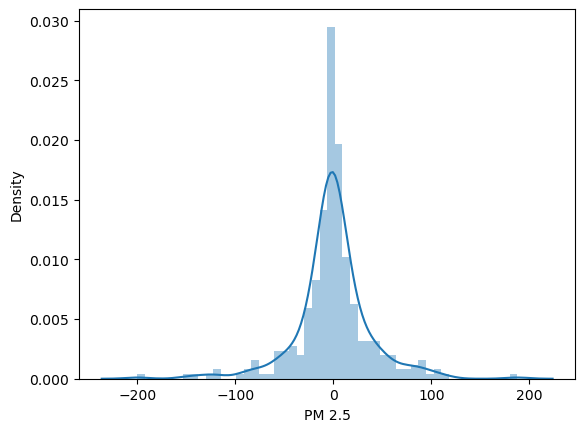

In [57]:
sns.distplot(Y_test-prediction)

Hyper_parameter Turning for RandomForestRegression 

In [62]:
from sklearn.model_selection import RandomizedSearchCV

#Randomized Search CV

#number of tree
n_estimators = [int(x) for x in np.linspace(start = 100, stop= 1200, num= 12)]

#Number of features to consider at every split
max_features = ['auto', 'sqrt']

#Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5,20, num =6)]
# max_depth.append(None)

#Minimum number of samples required to split a node
min_samples_split = [2,5,10,15,200]

#Minimum number of samples required at each leaf node
min_samples_leaf = [1,2,5,10]

#Method of selecting samples for training each tree
#booststrap = [True, False]

In [64]:
random_grid = {
    'n_estimators' : n_estimators,
    'max_features' : max_features,
    'max_depth' : max_depth,
    'min_samples_split' : min_samples_split,
    'min_samples_leaf' : min_samples_leaf
}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 8, 11, 14, 17, 20], 'min_samples_split': [2, 5, 10, 15, 200], 'min_samples_leaf': [1, 2, 5, 10]}


In [67]:
# Create a base model to tune 
rf = RandomForestRegressor()

rf_random = RandomizedSearchCV(estimator= rf , param_distributions= random_grid, scoring='neg_mean_squared_error',n_iter= 100,cv = 5, verbose=2, random_state= 42)

In [68]:
rf_random.fit(X_train,Y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=400; total time=   0.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=400; total time=   0.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=400; total time=   0.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=400; total time=   0.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=400; total time=   0.3s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=5, n_es

[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=900; total time=   1.4s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=900; total time=   1.6s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200; total time=   0.2s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=15, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.1s
[CV] END max_depth=8, max_features=sqrt, 

[CV] END max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=200, n_estimators=300; total time=   0.2s
[CV] END max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=200, n_estimators=300; total time=   0.2s
[CV] END max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=200, n_estimators=300; total time=   0.2s
[CV] END max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=200, n_estimators=300; total time=   0.2s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=100; total time=   0.0s
[CV] END max_depth=14, max_featu

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10, n_estimators=600; total time=   0.8s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=900; total time=   1.8s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=900; total time=   1.8s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=900; total time=   1.9s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=900; total time=   2.1s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=900; total time=   2.8s
[CV] END max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   0.4s
[CV] END max_depth=11, max_features=sqrt, min_samples_leaf=5, min_samples_split=2, n_estimators=200; total time=   0.3s
[CV] END max_depth=11, max_feature

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=400; total time=   0.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=400; total time=   0.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=5, min_samples_split=10, n_estimators=400; total time=   0.4s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1200; total time=   1.2s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1200; total time=   1.2s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1200; total time=   1.2s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1200; total time=   1.5s
[CV] END max_depth=8, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=1200; total time=   1.3s
[CV] END max_depth=8, max_featur

[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=500; total time=   0.3s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=500; total time=   0.5s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=500; total time=   0.5s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=500; total time=   0.5s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=500; total time=   0.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=600; total time=   0.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=600; total time=   0.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=600; total time=   0.6s
[CV] END max_depth=20,

[CV] END max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=300; total time=   0.5s
[CV] END max_depth=11, max_features=auto, min_samples_leaf=1, min_samples_split=15, n_estimators=300; total time=   0.5s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   2.6s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   3.8s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   4.9s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   3.8s
[CV] END max_depth=14, max_features=auto, min_samples_leaf=1, min_samples_split=10, n_estimators=1200; total time=   4.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=200; total time=   0.3s
[CV] END max_depth=5, max_fe

[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=1100; total time=   1.0s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=1100; total time=   0.9s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=1100; total time=   1.1s
[CV] END max_depth=14, max_features=sqrt, min_samples_leaf=10, min_samples_split=200, n_estimators=1100; total time=   1.2s
[CV] END max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.5s
[CV] END max_depth=8, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=300; total time=   0.6s
[CV] END max_depth=8, max_fe

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   param_distributions={'max_depth': [5, 8, 11, 14, 17, 20],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              200],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [70]:
print(rf_random.best_params_)
print(rf_random.best_score_)

{'n_estimators': 700, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 20}
-1579.5730181772


In [71]:
predictions = rf_random.predict(X_test)

from sklearn import metrics

print('MAE', metrics.mean_absolute_error(Y_test,predictions))
print('MSE',metrics.mean_squared_error(Y_test,predictions))
print('RMSE',np.sqrt(metrics.mean_squared_error(Y_test,predictions)))

MAE 24.990282156722028
MSE 1561.1627622010249
RMSE 39.511552262610806


Xgboot Regressor


In [4]:
import xgboost as xgb

In [14]:
regressor = xgb.XGBRegressor()
regressor.fit(X_train,Y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [15]:
# the results show clean view under_fitting 
print('Train_set R^2 value {}'.format(regressor.score(X_train,Y_train)))

print('Test_set R^2 value {}'.format(regressor.score(X_test,Y_test)))

Train_set R^2 value 0.9997717196345083
Test_set R^2 value 0.8123312908288712


In [16]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(regressor,X,Y,cv=5)

In [17]:
score.mean()

0.7251276747945072

In [19]:
prediction = regressor.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

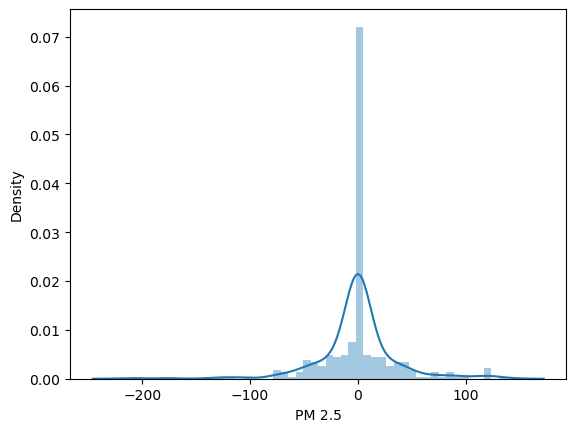

In [20]:
sns.distplot(Y_test-prediction)

Hyperparmeter Tuning

In [21]:
xgb.XGBRegressor()

from sklearn.model_selection import RandomizedSearchCV

In [22]:
n_estimators = [int(x) for x in np.linspace(start= 100, stop = 1200, num =12)]

learning_rate = ['0.05','0.1','0.2','0.3','0.5','0.6']

max_depth = [int(x) for x in np.linspace(5,30,num =6)]

subsample= [0.7,0.6,0.8]

min_child_weight = [3,4,5,6,7]

In [24]:
random_grid = {
    'n_estimators': n_estimators,
    'learning_rate': learning_rate,
    'max_depth' : max_depth,
    'subsample' : subsample,
    'min_child_weight' : min_child_weight
}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'learning_rate': ['0.05', '0.1', '0.2', '0.3', '0.5', '0.6'], 'max_depth': [5, 10, 15, 20, 25, 30], 'subsample': [0.7, 0.6, 0.8], 'min_child_weight': [3, 4, 5, 6, 7]}


In [25]:
regressor = xgb.XGBRegressor()

xg_random = RandomizedSearchCV(estimator= regressor, param_distributions= random_grid,scoring= 'neg_mean_squared_error', n_iter=100, cv=5,verbose=2, random_state=42)

In [26]:
xg_random.fit(X_train,Y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=6, n_estimators=1100, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=6, n_estimators=1100, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=6, n_estimators=1100, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=6, n_estimators=1100, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=6, n_estimators=1100, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=600, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=600, subsample=0.7; total time=   0.9s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=6, n_estimators=600, subsample=0.7; total time=   0.7s
[CV] END learning_ra

[CV] END learning_rate=0.5, max_depth=30, min_child_weight=7, n_estimators=1100, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=7, n_estimators=1100, subsample=0.7; total time=   1.1s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=7, n_estimators=1100, subsample=0.7; total time=   0.8s
[CV] END learning_rate=0.3, max_depth=25, min_child_weight=5, n_estimators=800, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.3, max_depth=25, min_child_weight=5, n_estimators=800, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.3, max_depth=25, min_child_weight=5, n_estimators=800, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.3, max_depth=25, min_child_weight=5, n_estimators=800, subsample=0.6; total time=   0.9s
[CV] END learning_rate=0.3, max_depth=25, min_child_weight=5, n_estimators=800, subsample=0.6; total time=   0.8s
[CV] END learning_rate=0.1, max_depth=15, min_child_weight=7, n_estimators=600, subsa

[CV] END learning_rate=0.1, max_depth=5, min_child_weight=4, n_estimators=1200, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=6, n_estimators=100, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=6, n_estimators=100, subsample=0.8; total time=   0.1s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=6, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=6, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=6, n_estimators=100, subsample=0.8; total time=   0.0s
[CV] END learning_rate=0.6, max_depth=25, min_child_weight=7, n_estimators=800, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.6, max_depth=25, min_child_weight=7, n_estimators=800, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.6, max_depth=25, min_child_weight=7, n_estimators=800, subsampl

[CV] END learning_rate=0.05, max_depth=30, min_child_weight=3, n_estimators=1100, subsample=0.8; total time=   1.8s
[CV] END learning_rate=0.05, max_depth=30, min_child_weight=3, n_estimators=1100, subsample=0.8; total time=   1.9s
[CV] END learning_rate=0.05, max_depth=30, min_child_weight=3, n_estimators=1100, subsample=0.8; total time=   2.0s
[CV] END learning_rate=0.05, max_depth=30, min_child_weight=3, n_estimators=1100, subsample=0.8; total time=   1.9s
[CV] END learning_rate=0.2, max_depth=30, min_child_weight=5, n_estimators=1200, subsample=0.6; total time=   1.8s
[CV] END learning_rate=0.2, max_depth=30, min_child_weight=5, n_estimators=1200, subsample=0.6; total time=   1.7s
[CV] END learning_rate=0.2, max_depth=30, min_child_weight=5, n_estimators=1200, subsample=0.6; total time=   1.5s
[CV] END learning_rate=0.2, max_depth=30, min_child_weight=5, n_estimators=1200, subsample=0.6; total time=   1.7s
[CV] END learning_rate=0.2, max_depth=30, min_child_weight=5, n_estimators=1

[CV] END learning_rate=0.3, max_depth=10, min_child_weight=7, n_estimators=800, subsample=0.7; total time=   0.7s
[CV] END learning_rate=0.3, max_depth=10, min_child_weight=7, n_estimators=800, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.05, max_depth=15, min_child_weight=6, n_estimators=300, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=15, min_child_weight=6, n_estimators=300, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.05, max_depth=15, min_child_weight=6, n_estimators=300, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=15, min_child_weight=6, n_estimators=300, subsample=0.8; total time=   0.5s
[CV] END learning_rate=0.05, max_depth=15, min_child_weight=6, n_estimators=300, subsample=0.8; total time=   0.4s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=5, n_estimators=300, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.3, max_depth=20, min_child_weight=5, n_estimators=300, sub

[CV] END learning_rate=0.5, max_depth=25, min_child_weight=3, n_estimators=400, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.5, max_depth=25, min_child_weight=3, n_estimators=400, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.5, max_depth=25, min_child_weight=3, n_estimators=400, subsample=0.6; total time=   0.6s
[CV] END learning_rate=0.5, max_depth=25, min_child_weight=3, n_estimators=400, subsample=0.6; total time=   0.6s
[CV] END learning_rate=0.5, max_depth=25, min_child_weight=3, n_estimators=400, subsample=0.6; total time=   1.0s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=3, n_estimators=900, subsample=0.7; total time=   0.6s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=3, n_estimators=900, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=3, n_estimators=900, subsample=0.7; total time=   0.5s
[CV] END learning_rate=0.5, max_depth=30, min_child_weight=3, n_estimators=900, subsampl

[CV] END learning_rate=0.3, max_depth=5, min_child_weight=4, n_estimators=100, subsample=0.6; total time=   0.0s
[CV] END learning_rate=0.3, max_depth=5, min_child_weight=4, n_estimators=100, subsample=0.6; total time=   0.0s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=3, n_estimators=800, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=3, n_estimators=800, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=3, n_estimators=800, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=3, n_estimators=800, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.5, max_depth=20, min_child_weight=3, n_estimators=800, subsample=0.8; total time=   0.3s
[CV] END learning_rate=0.5, max_depth=5, min_child_weight=6, n_estimators=900, subsample=0.6; total time=   0.4s
[CV] END learning_rate=0.5, max_depth=5, min_child_weight=6, n_estimators=900, subsample=0.

RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, gpu_id=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          num_parallel_tree=None,
                                         

In [27]:
print(xg_random.best_params_)
print(xg_random.best_score_)

{'subsample': 0.8, 'n_estimators': 1100, 'min_child_weight': 3, 'max_depth': 30, 'learning_rate': '0.05'}
-1380.6366880668838


In [28]:
predictions = xg_random.predict(X_test)

from sklearn import metrics

print('MAE', metrics.mean_absolute_error(Y_test,predictions))
print('MSE',metrics.mean_squared_error(Y_test,predictions))
print('RMSE',np.sqrt(metrics.mean_squared_error(Y_test,predictions)))

MAE 19.02743722623126
MSE 1355.7081047805843
RMSE 36.81994167269395


KNN Regression- works on Eualinear- Distance Concept

In [46]:
from sklearn.neighbors import KNeighborsRegressor

regressor = KNeighborsRegressor(n_neighbors=1)
regressor.fit(X_train,Y_train)

KNeighborsRegressor(n_neighbors=1)

In [47]:
# the results show clean view over_fitting 
print('Train_set R^2 value {}'.format(regressor.score(X_train,Y_train)))

print('Test_set R^2 value {}'.format(regressor.score(X_test,Y_test)))

Train_set R^2 value 1.0
Test_set R^2 value 0.5417545333477789


In [48]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(regressor,X,Y,cv=5)

In [49]:
score.mean()

0.39387489016756577

In [50]:
prediction = regressor.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

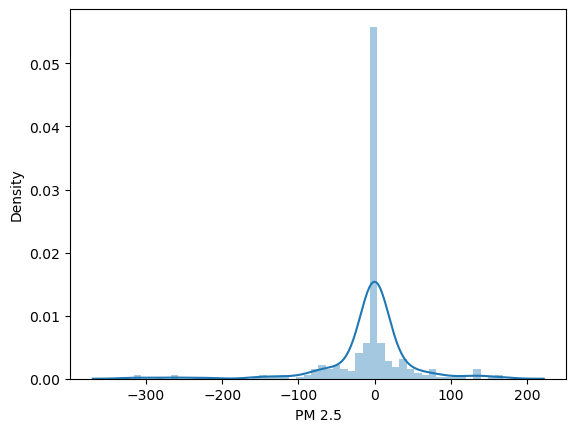

In [51]:
sns.distplot(Y_test-prediction)

Hyper-parameter Tuning

In [54]:
accuracy_rate = []

for i in range(1,40):
    knn = KNeighborsRegressor(n_neighbors=i)
    score = cross_val_score(knn,X,Y,cv=10,scoring='neg_mean_squared_error')
    accuracy_rate.append(score.mean())

In [55]:
print(accuracy_rate)

[-3313.1422505508062, -2899.0314433509407, -3284.5243665217095, -3317.279988207386, -3335.442210407435, -3400.904747138454, -3469.9207164183877, -3417.0133615067652, -3416.7957560673376, -3454.1987626354485, -3458.561967648785, -3506.0418919791628, -3526.2341867771916, -3543.266012789109, -3543.9452857545575, -3536.191746081263, -3520.8407733401377, -3498.542714344937, -3503.7950317914933, -3495.9653877503465, -3497.998427901154, -3490.5630773743665, -3482.5177500963487, -3495.805531611562, -3509.4153978437207, -3488.5900860084703, -3500.045820751018, -3498.5524311206586, -3503.7679530398104, -3519.3080111715744, -3522.5488401980388, -3541.8813390673577, -3547.557970469113, -3553.8470442853154, -3563.6683475537384, -3556.2286919807752, -3555.1569008322417, -3561.2943599939667, -3568.9597845299454]


Text(0, 0.5, 'Accuaracy Rate')

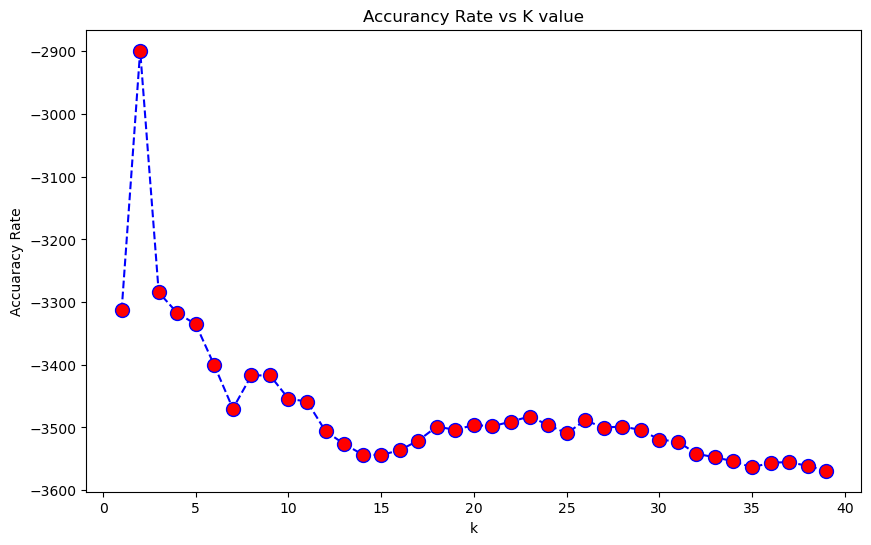

In [56]:
plt.figure(figsize=(10,6))
plt.plot(range(1,40),accuracy_rate,color='blue',linestyle= 'dashed',marker='o', markerfacecolor='red',markersize=10)
plt.title('Accurancy Rate vs K value')
plt.xlabel('k')
plt.ylabel('Accuaracy Rate')


In [57]:
predictions = regressor.predict(X_test)

from sklearn import metrics

print('MAE', metrics.mean_absolute_error(Y_test,predictions))
print('MSE',metrics.mean_squared_error(Y_test,predictions))
print('RMSE',np.sqrt(metrics.mean_squared_error(Y_test,predictions)))

MAE 26.46491361788618
MSE 3282.779510713076
RMSE 57.295545295538254


In [29]:
import pickle

file = open('Xgbooster_regression _model.pkl','wb')

pickle.dump(xg_random,file)

In [33]:
print("Liner Regression")
print("MAE 44.83624126628639")
print("MSE 3687.5430309324192")
print("RMSE 60.725143317512384")

print("\n")

print("Lasso Regression")
print("MAE 44.50831198875127")
print("MSE 3627.8109390424697")
print("RMSE 60.2313119485411")
      
print("\n")

print("Random_Forest_Regression")
print("MAE 24.990282156722028")
print("MSE 1561.1627622010249")
print("RMSE 39.51155226261080")

print("\n")

print("Xgbooster_Regression")
print("MAE 19.02743722623126")
print("MSE 1355.7081047805843")
print("RMSE 36.81994167269395")



Liner Regression
MAE 44.83624126628639
MSE 3687.5430309324192
RMSE 60.725143317512384


Lasso Regression
MAE 44.50831198875127
MSE 3627.8109390424697
RMSE 60.2313119485411


Random_Forest_Regression
MAE 24.990282156722028
MSE 1561.1627622010249
RMSE 39.51155226261080


Xgbooster_Regression
MAE 19.02743722623126
MSE 1355.7081047805843
RMSE 36.81994167269395
